# Mutli channels ICA applied to OBS data 

In [1]:
import os
import numpy as np
import pandas as pd
import scipy.signal as sp
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile

from utils import *
from skimage.metrics import structural_similarity as ssim

## Synthetic data

In [2]:
# FFT params
nperseg = 512
noverlap = 256
fs = 100

# Noise
np.random.seed(0)
snr = 5     # dB 

c:\Users\baptiste.menetrier\Desktop\devPy\phd\separation\ica\utils.py:346: RuntimeWarning: divide by zero encountered in log10
  20 * np.log10(abs(data["stft"][iv])),


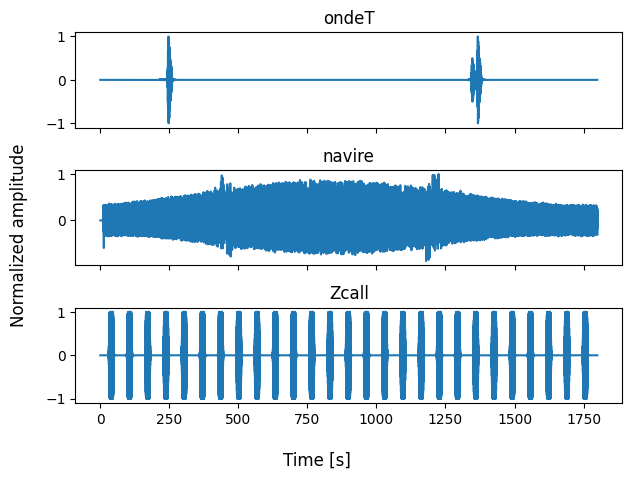

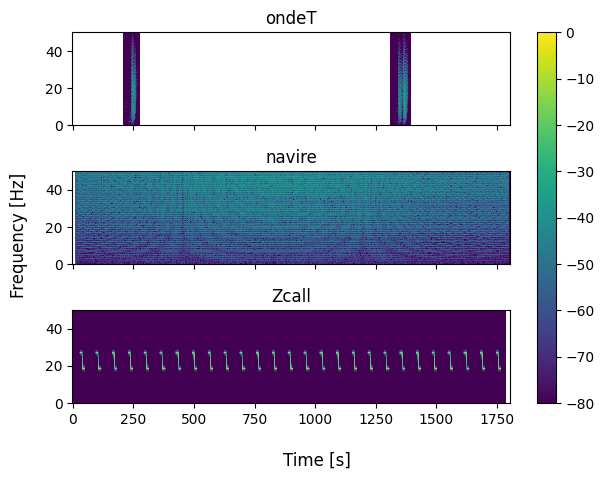

In [3]:
data = load_synthetic_data(fs, nperseg, noverlap, snr=None)  
plot_input_signals(data)

### Cas identique à JL 
Configuration type OBS : 4 récepteurs
Mélange : uniforme (pas de bruit sur la matrice de mélange)  

In [4]:
print(data["vars"])
X, S, A = mix_synthetic_signals(data, snr=None, mixing_noise_level=0, verbose=True, a0=2, n_rcv=4)
S_, A_ = apply_ica(X, n_components=3)

['ondeT', 'navire', 'Zcall']
Mixing matrix : [[2. 1. 1.]
 [2. 1. 1.]
 [2. 1. 1.]
 [2. 1. 1.]]
ICA model applies : False
Components : [[-0.00902072 -0.00793437  0.02002601 -0.00310179]
 [ 0.00463473 -0.0172662  -0.00247196  0.01510824]
 [ 0.00167787  0.00168502  0.00165559  0.00166876]]
Mixing : [[-16.09424321   8.38555949 149.46500707]
 [-14.22070273 -31.14481159 149.4924372 ]
 [ 36.21641824  -4.33170414 149.709997  ]
 [ -5.38909087  27.31455528 149.48886757]]
Mean : [ 0.00045542 -0.00010379  0.00052157  0.00013001]


Text(0.5, 1.0, 'Spectrogramme de base')

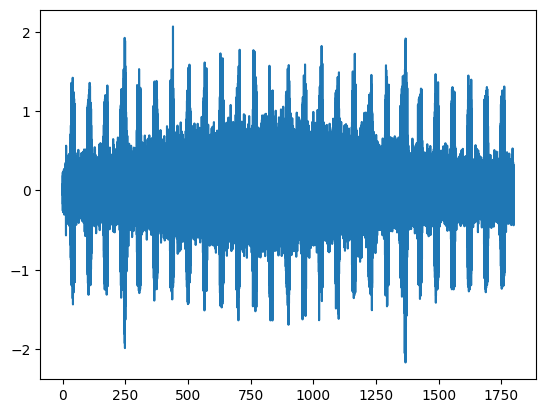

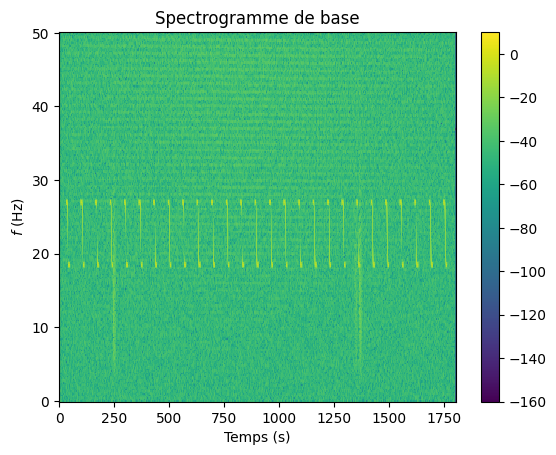

In [5]:
sig = X[:, 0]

plt.figure()
plt.plot(data["time"], sig)

f, t, st = sp.stft(
    sig, fs=100, window="hann", nperseg=nperseg, noverlap=noverlap
)
plt.figure()
plt.pcolormesh(t, f, 20 * np.log10(abs(st)))
plt.clim([-160, +10])
plt.colorbar()
plt.xlabel("Temps (s)")
plt.ylabel("$f$ (Hz)")
plt.title("Spectrogramme de base")

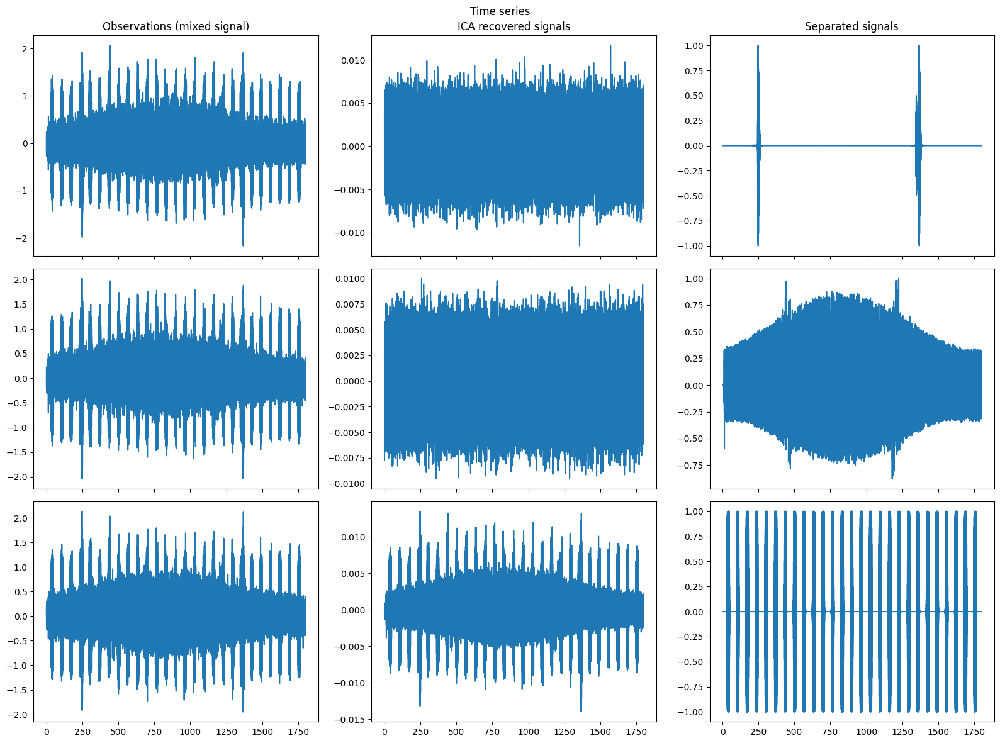

c:\Users\baptiste.menetrier\Desktop\devPy\phd\separation\ica\utils.py:140: RuntimeWarning: divide by zero encountered in log10
  20 * np.log10(abs(separated_data["stft"][i])),


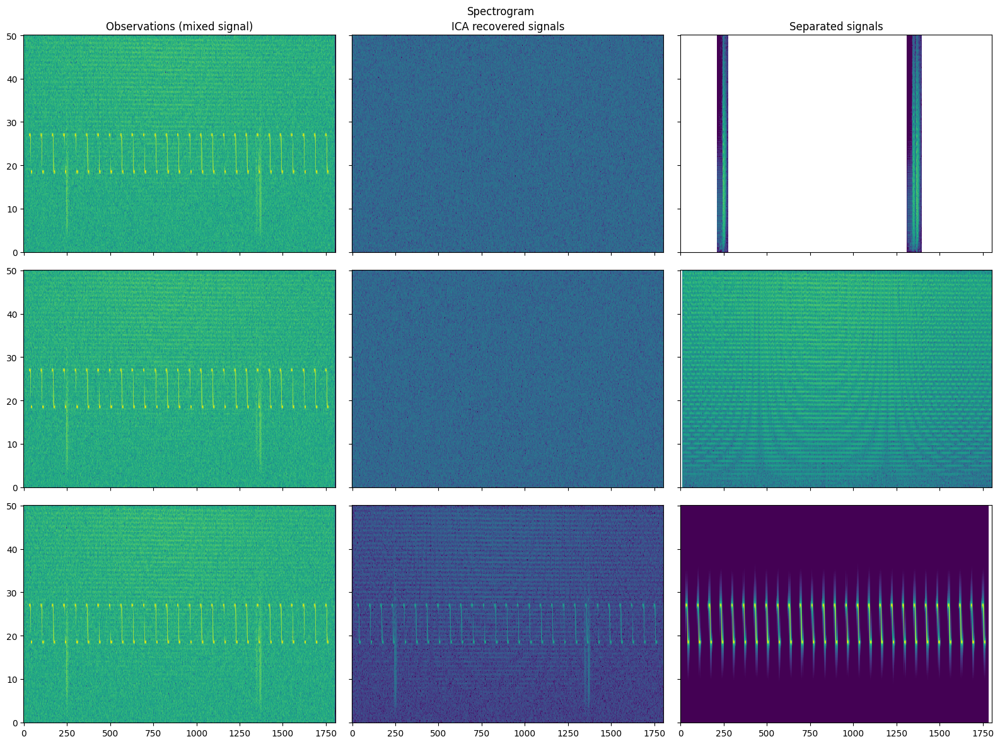

In [6]:
time, mixed_signals, reconstructed_signals = analyse_ica(X, S_, fs, nperseg, noverlap)
plot_ica_results(time, mixed_signals, reconstructed_signals, separated_data=data, vmin=-120)

La méthode sépare la composante signal de la composante bruit blanc gaussien mais est incapable de séparer les différents signaux. 

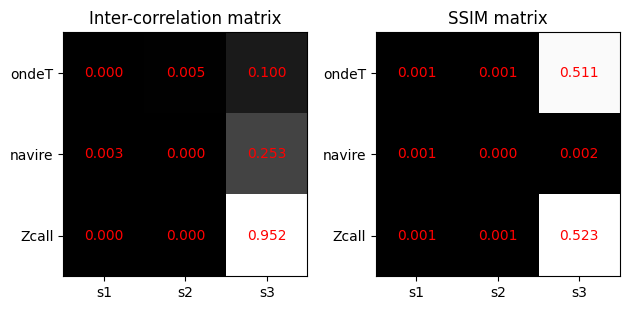

In [7]:
inter_corr_mat, ssim_mat = ica_perf_analysis(reconstructed_signals, data)
plot_ica_perf(inter_corr_mat, ssim_mat, data["vars"])

Remarque : la ssim du bruit avec les spectrogrammes des signaux impulsifs (onde T et z-calls) est relativement élevé. Ceci remet en question la capacité de la ssim à réellement quantifier les performances d'une méthode de séparation ? ..

### Cas performances améliorées 
Configuration type OBS : 4 récepteurs
Mélange : ajout d'un bruit dans la matrice de mélange afin d'augmenter l'indépendance des signaux 

In [8]:
print(data["vars"])
X, S, A = mix_synthetic_signals(data, snr=None, mixing_noise_level=0.9, verbose=True, a0=2, n_rcv=4)
S_, A_ = apply_ica(X, n_components=3)

['ondeT', 'navire', 'Zcall']
Mixing matrix : [[ 3.23812461  2.1869331   1.69093919]
 [ 2.75344652  1.99963995  1.32207999]
 [ 0.64647967  0.32251117 -0.03314803]
 [ 2.01366198 -1.65271027  0.29577702]]
ICA model applies : False
Components : [[-0.00048429 -0.00205331 -0.00222598  0.01053301]
 [ 0.00237193  0.00124126 -0.00091924  0.00381503]
 [ 0.00515065 -0.00603347 -0.02140194 -0.00463373]]
Mixing : [[-82.72423492 244.03968095   7.80130995]
 [-77.10664829 190.31430616 -12.24107944]
 [-14.00787946  -5.14692688 -39.1653173 ]
 [ 73.14460091  47.23263905 -10.30453397]]
Mean : [-1.72532852e-04 -2.01351810e-04  1.63116709e-04  5.03175789e-05]


Text(0.5, 1.0, 'Spectrogramme de base')

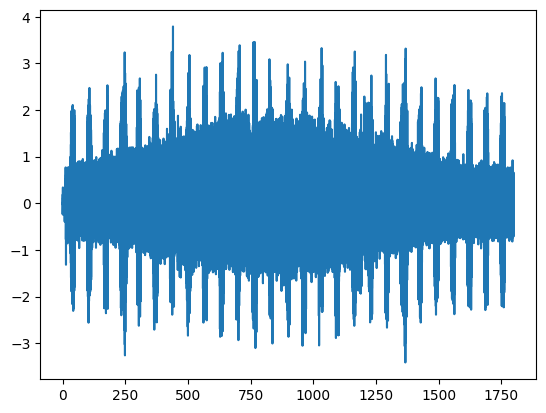

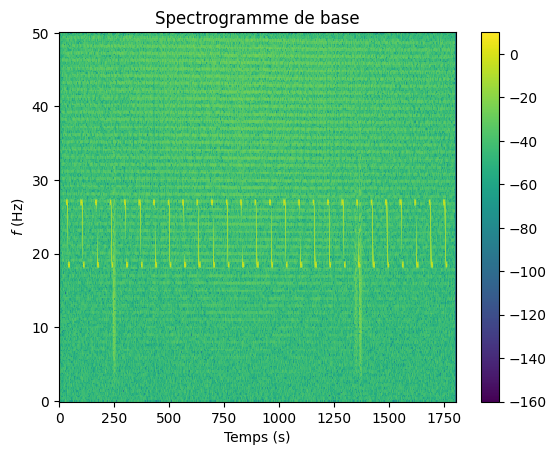

In [9]:
sig = X[:, 0]

plt.figure()
plt.plot(data["time"], sig)

f, t, st = sp.stft(
    sig, fs=100, window="hann", nperseg=nperseg, noverlap=noverlap
)
plt.figure()
plt.pcolormesh(t, f, 20 * np.log10(abs(st)))
plt.clim([-160, +10])
plt.colorbar()
plt.xlabel("Temps (s)")
plt.ylabel("$f$ (Hz)")
plt.title("Spectrogramme de base")

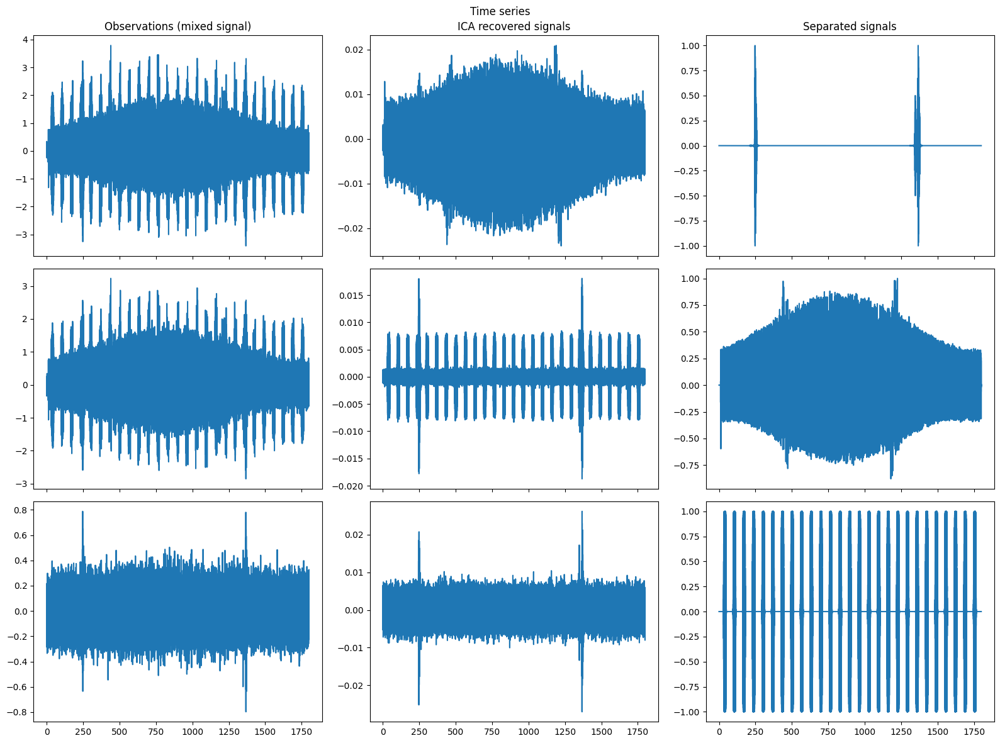

c:\Users\baptiste.menetrier\Desktop\devPy\phd\separation\ica\utils.py:140: RuntimeWarning: divide by zero encountered in log10
  20 * np.log10(abs(separated_data["stft"][i])),


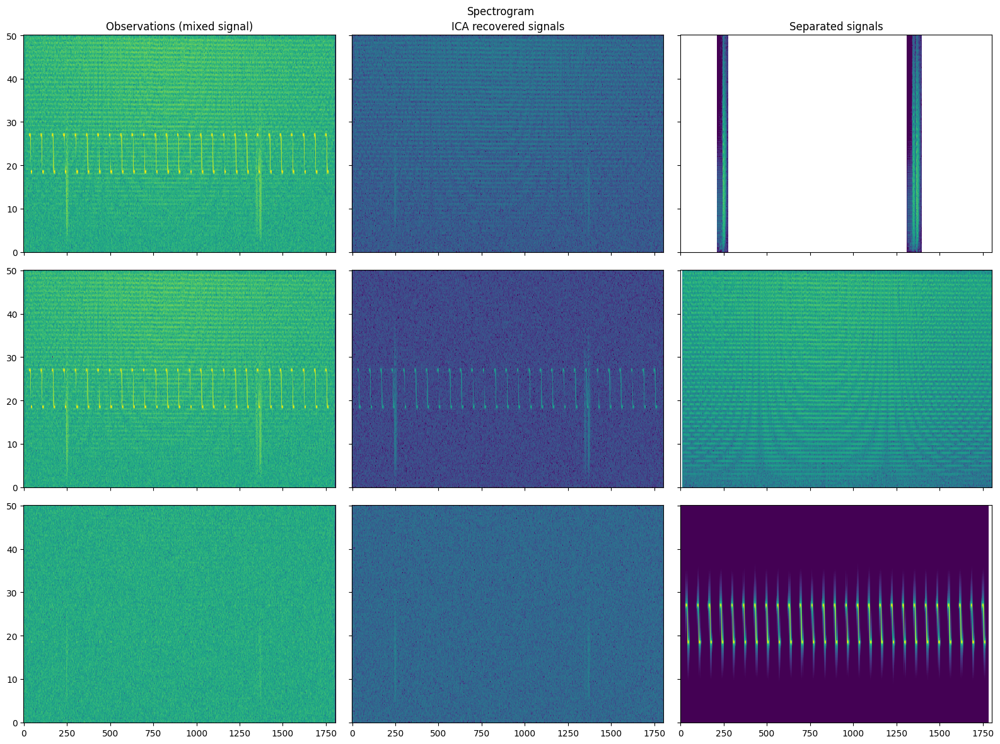

In [10]:
time, mixed_signals, reconstructed_signals = analyse_ica(X, S_, fs, nperseg, noverlap)
plot_ica_results(time, mixed_signals, reconstructed_signals, separated_data=data, vmin=-120)

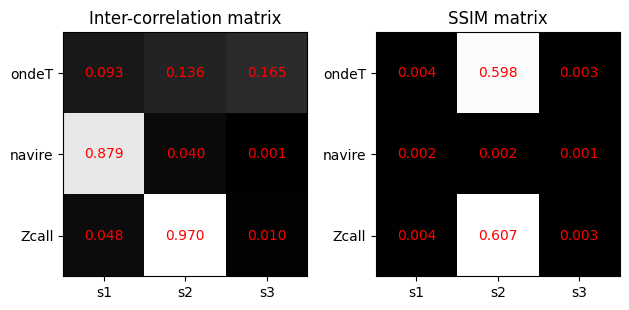

In [11]:
inter_corr_mat, ssim_mat = ica_perf_analysis(reconstructed_signals, data)
plot_ica_perf(inter_corr_mat, ssim_mat, data["vars"])

On peut quantifier les performances en fonction du bruit dans la matrice de mélange 

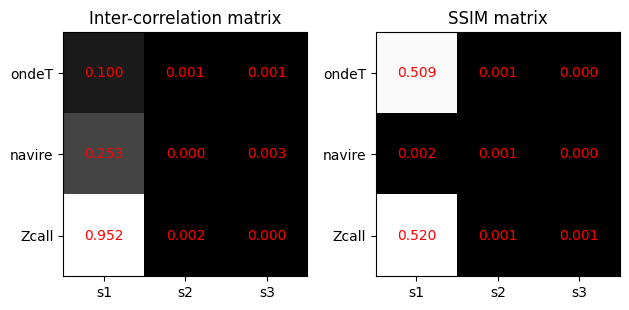

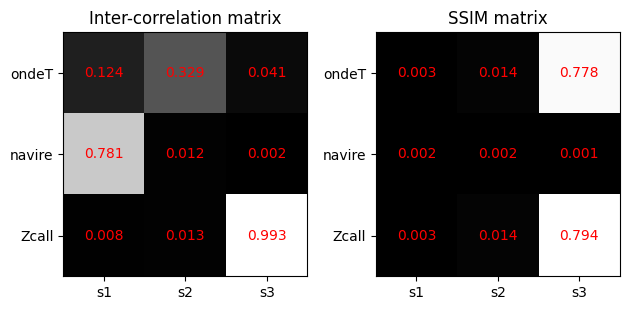

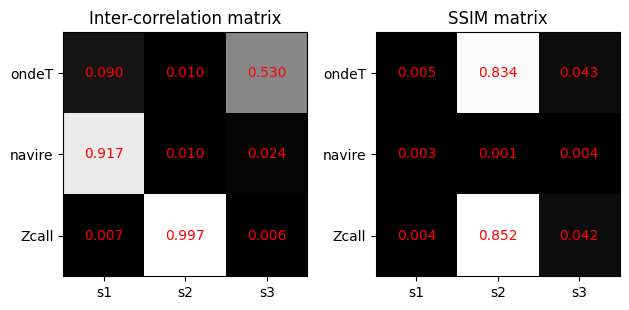

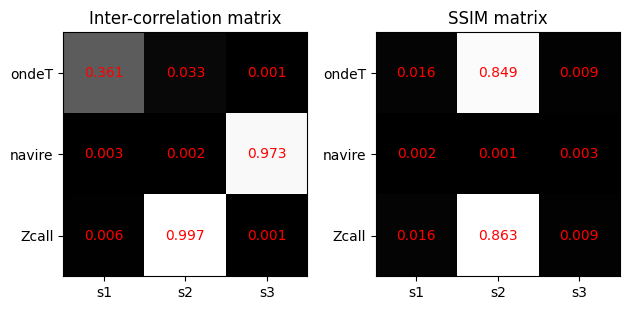

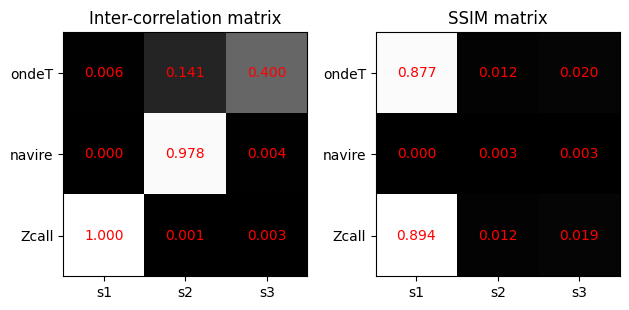

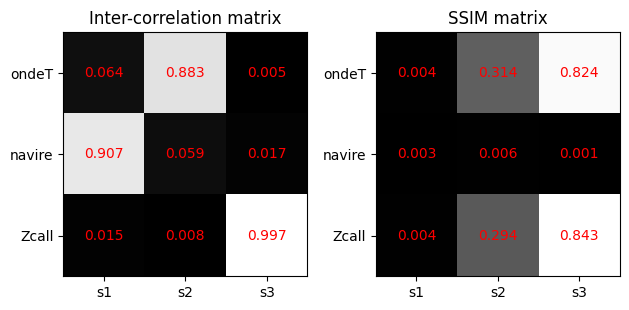

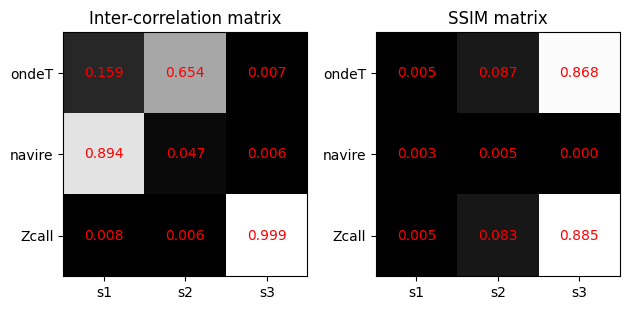

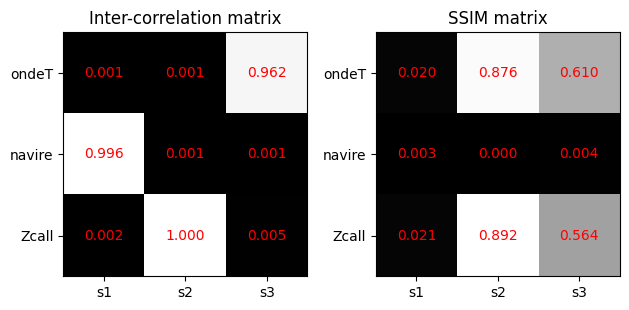

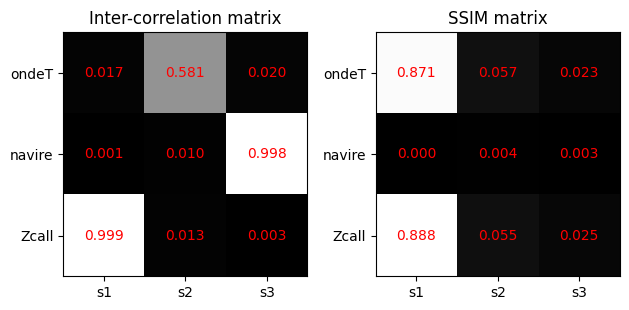

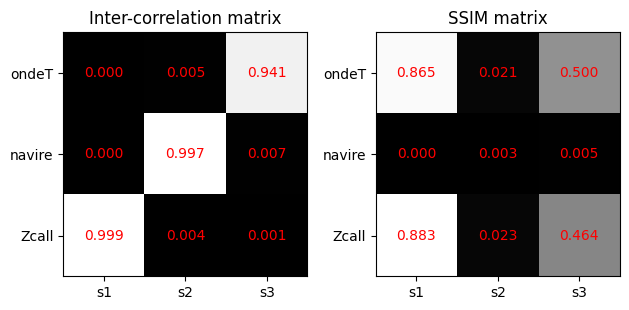

In [12]:
ssim_v = []

for noise_mixing_mat in np.linspace(0, 10, 10):
    X, S, A = mix_synthetic_signals(
        data, snr=None, mixing_noise_level=noise_mixing_mat, verbose=False, a0=2, n_rcv=4
    )
    S_, A_ = apply_ica(X, n_components=3, verbose=False)

    time, mixed_signals, reconstructed_signals = analyse_ica(
        X, S_, fs, nperseg, noverlap
    )

    inter_corr_mat, ssim_mat = ica_perf_analysis(reconstructed_signals, data, verbose=False)
    plot_ica_perf(inter_corr_mat, ssim_mat, data["vars"])

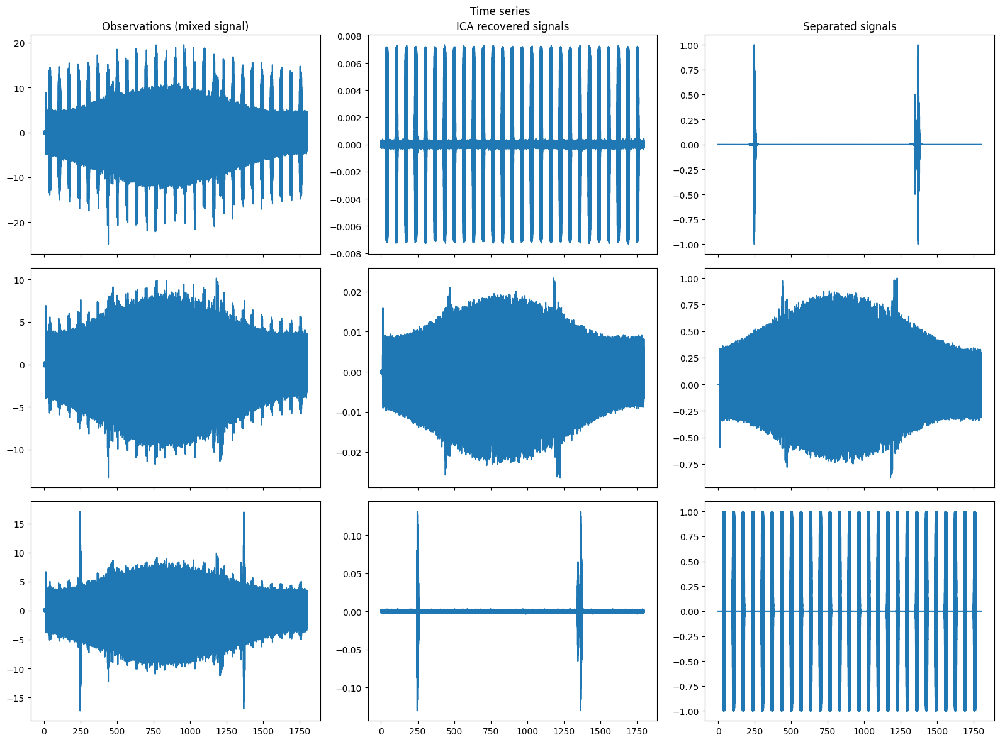

c:\Users\baptiste.menetrier\Desktop\devPy\phd\separation\ica\utils.py:140: RuntimeWarning: divide by zero encountered in log10
  20 * np.log10(abs(separated_data["stft"][i])),


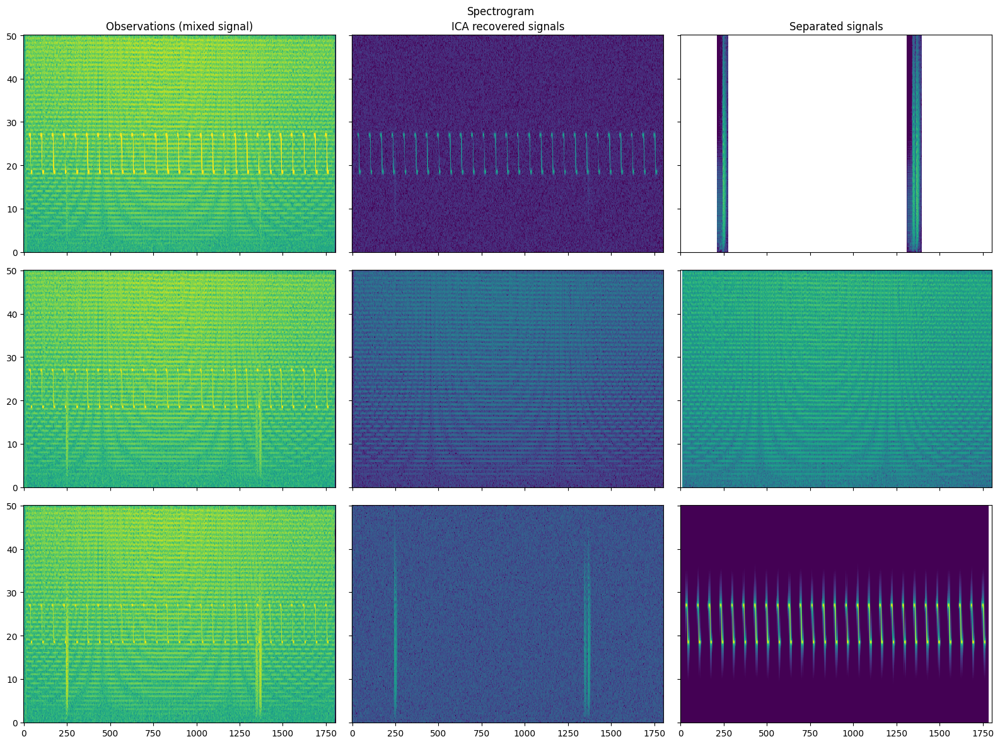

In [13]:
plot_ica_results(
    time, mixed_signals, reconstructed_signals, separated_data=data, vmin=-120
)

Dans le cas où le bruit sur la matrice de mélange est très important les signaux sont correctement séparés. 
On note néanmoins que la ssim est nulle pour le navire malgré la très bonne performance qualitative de la séparation. 

## Real data

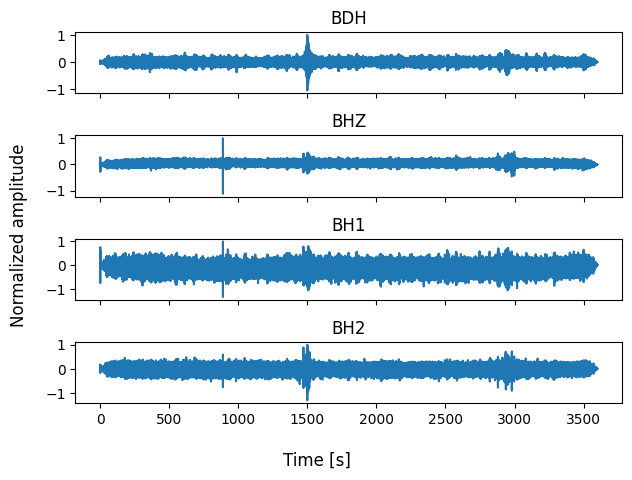

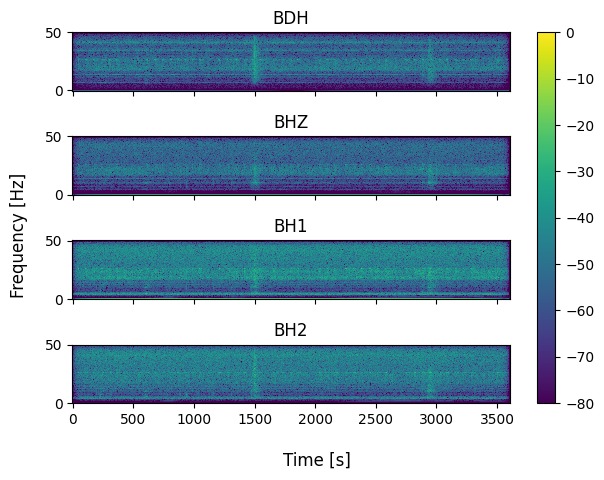

In [15]:
data = load_real_data(nperseg=nperseg, noverlap=noverlap)
plot_input_signals(data)

['BDH', 'BHZ', 'BH1', 'BH2']
ICA model applies : False
Components : [[ 0.00040433  0.00063041  0.01046479 -0.00010013]]
Mixing : [[ 3.67296292]
 [ 5.72670613]
 [95.06289391]
 [-0.90960598]]
Mean : [-1.14130425e-05  4.39982714e-02 -1.17789873e-01 -2.79818717e-02]


IndexError: too many indices for array: array is 1-dimensional, but 2 were indexed

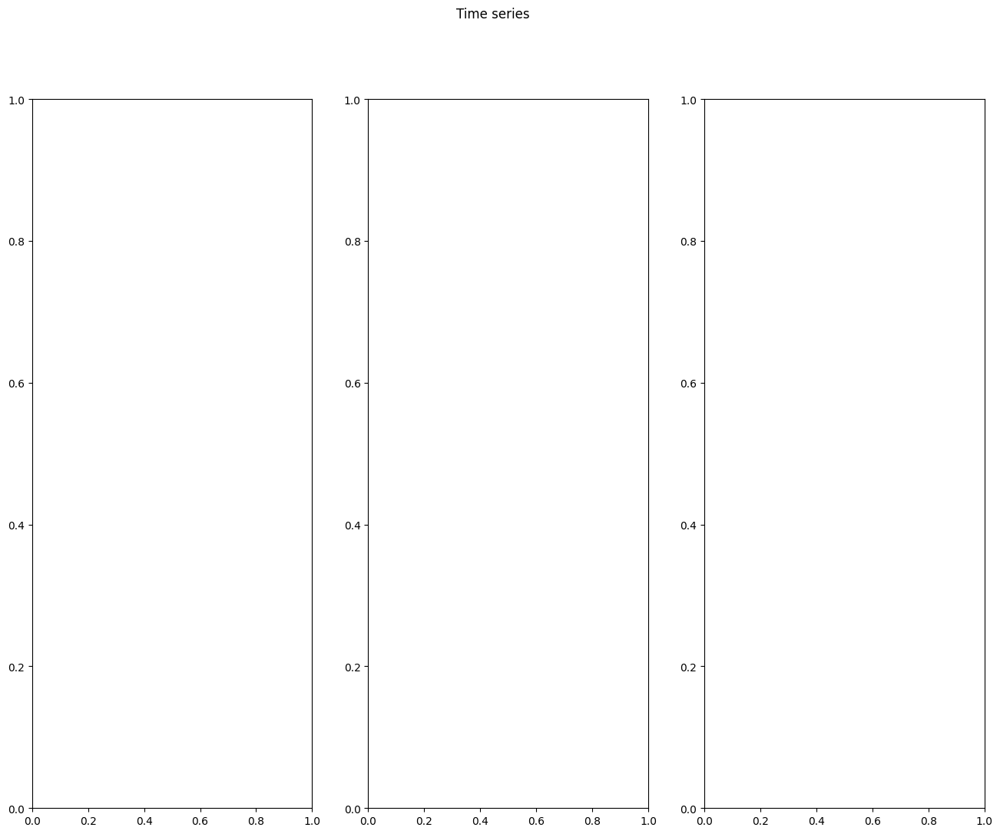

In [19]:
print(data["vars"])
X = np.c_[tuple([data["signal"][iv] for iv in range(len(data["vars"]))])]

S_, A_ = apply_ica(X, n_components=3)
time, mixed_signals, reconstructed_signals = analyse_ica(X, S_, fs, nperseg, noverlap)
plot_ica_results(
    time, mixed_signals, reconstructed_signals, separated_data=data, vmin=-120
)
inter_corr_mat, ssim_mat = ica_perf_analysis(reconstructed_signals, data)
plot_ica_perf(inter_corr_mat, ssim_mat, data["vars"])